#### Cai 2020 abridged QC

**Objective**: Run QC steps without normalisation/UMAP for Yoshida 2021 healthy control data

- **Developed by**: Mairi McClean
- **Affiliation**: Institute of Computational Biology, Helmholtz Zentrum Munich
- **v230628**

### Import required modules

In [2]:
import anndata
import logging
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scrublet as scr
import matplotlib.pyplot as plt
import pybiomart as biomart
from matplotlib import colors
from matplotlib import rcParams

#### Log file and figure output settings

In [3]:
%matplotlib inline
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 180, vector_friendly = True, format = 'svg')

-----
anndata     0.9.1
scanpy      1.9.3
-----
CoreFoundation      NA
Foundation          NA
PIL                 9.5.0
PyObjCTools         NA
anyio               NA
appnope             0.1.3
asttokens           NA
attr                23.1.0
babel               2.12.1
backcall            0.2.0
certifi             2023.05.07
cffi                1.15.1
charset_normalizer  3.1.0
cloudpickle         2.2.1
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
cytoolz             0.12.0
dask                2023.5.1
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
defusedxml          0.7.1
executing           1.2.0
fastjsonschema      NA
future              0.18.3
h5py                3.8.0
idna                3.4
igraph              0.10.4
importlib_resources NA
ipykernel           6.23.1
jedi                0.18.2
jinja2              3.1.2
joblib              1.2.0
json5               NA
jsonschema          4.17.3
j

### Read in datasets

In [4]:
adata = sc.read_h5ad('/Volumes/Expansion/data_lake/INBOX/tb_cc/raw_data_objects/single_cell/human/yoshida2021/meyer_nikolic_covid_pbmc_raw.h5ad')
adata

AnnData object with n_obs × n_vars = 422220 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'patient_id', 'sample_id', 'sequencing_library', 'Protein_modality_weight'
    var: 'name'

In [6]:
adata.var

,name
index,
MIR1302-2HG,MIR1302-2HG
FAM138A,FAM138A
OR4F5,OR4F5
AL627309.1,AL627309.1
AL627309.3,AL627309.3
...,...
VIRAL-Mumps-rubulavirus,VIRAL-Mumps-rubulavirus
VIRAL-Rubella,VIRAL-Rubella
VIRAL-Varicella-Zoster-Virus-(VZV-Human-alphaherpesvirus-3),VIRAL-Varicella-Zoster-Virus-(VZV-Human-alphah...


In [8]:
# checks the number of molecules counted per barcode(?), using "donor" as proxy(?)
adata.obs['sample_id'].value_counts()

sample_id
AP6     15700
AP11    12207
PP3     10293
AP5     10097
AP12    10033
        ...  
AN3      1041
PP9      1017
AN1       915
PC27      431
PP11       72
Name: count, Length: 80, dtype: int64

- Filter out COVID-associated samples

In [5]:
adata_healthy = adata[adata.obs['COVID_status'].isin(['Healthy'])]
adata_healthy

View of AnnData object with n_obs × n_vars = 173684 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'patient_id', 'sample_id', 'sequencing_library', 'Protein_modality_weight'
    var: 'name'

In [6]:
# Make names unique to avoid computational issues re repeated gene names
adata.var_names_make_unique()
sample_object = adata_healthy.copy()
sample_object

AnnData object with n_obs × n_vars = 173684 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'patient_id', 'sample_id', 'sequencing_library', 'Protein_modality_weight'
    var: 'name'

In [7]:
sample_object.var_names = [str(i) for i in sample_object.var_names]
sample_object.var_names_make_unique()

### Top 20 scatterplot

normalizing counts per cell
    finished (0:00:03)


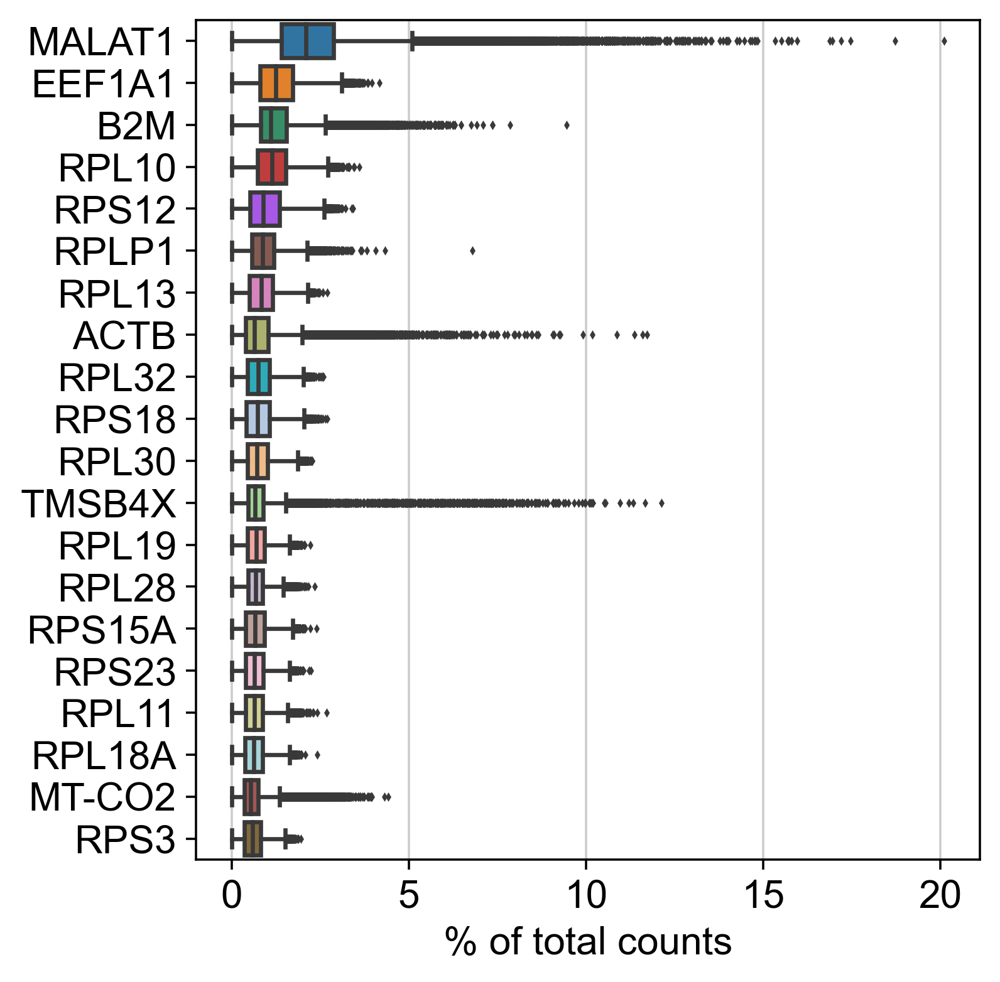

In [34]:
sc.pl.highest_expr_genes(sample_object, n_top=20)

### Initial filtering

- By genes

In [8]:
sc.pp.filter_cells(sample_object, min_genes = 200)
print(sample_object.n_obs, sample_object.n_vars)

173684 33559


In [36]:
sample_object.shape

(173684, 33559)

- By cell

In [9]:
sc.pp.filter_genes(sample_object, min_cells = 3)
sample_object.shape

filtered out 10673 genes that are detected in less than 3 cells


(173684, 22886)

### QC metrics

In [10]:
sample_object.var['mt'] = sample_object.var_names.str.startswith('MT-')
sample_object.var['ribo'] = sample_object.var_names.str.startswith(("RPS","RPL"))
sample_object.var["hb"] = sample_object.var_names.str.contains(("^HB[^(P)]"))
sample_object.var

,name,n_cells,mt,ribo,hb
AL627309.1,AL627309.1,106,False,False,False
AL627309.2,AL627309.2,9,False,False,False
AL669831.5,AL669831.5,1140,False,False,False
FAM87B,FAM87B,54,False,False,False
LINC00115,LINC00115,2935,False,False,False
...,...,...,...,...,...
AC004556.1,AC004556.1,1472,False,False,False
AC233755.2,AC233755.2,149,False,False,False
AC233755.1,AC233755.1,526,False,False,False
AC240274.1,AC240274.1,1762,False,False,False


- Check values present in new columns

In [39]:
sample_object.var['mt'].value_counts()

mt
False    22873
True        13
Name: count, dtype: int64

In [40]:
sample_object.var['ribo'].value_counts()

ribo
False    22785
True       101
Name: count, dtype: int64

In [41]:
sample_object.var['hb'].value_counts()

hb
False    22874
True        12
Name: count, dtype: int64

In [11]:
sc.pp.calculate_qc_metrics(sample_object, qc_vars = ['mt', 'ribo', 'hb'], percent_top = None, log1p = False, inplace = True)

In [43]:
sample_object

AnnData object with n_obs × n_vars = 173684 × 22886
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'patient_id', 'sample_id', 'sequencing_library', 'Protein_modality_weight', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'name', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

### QC visualisation

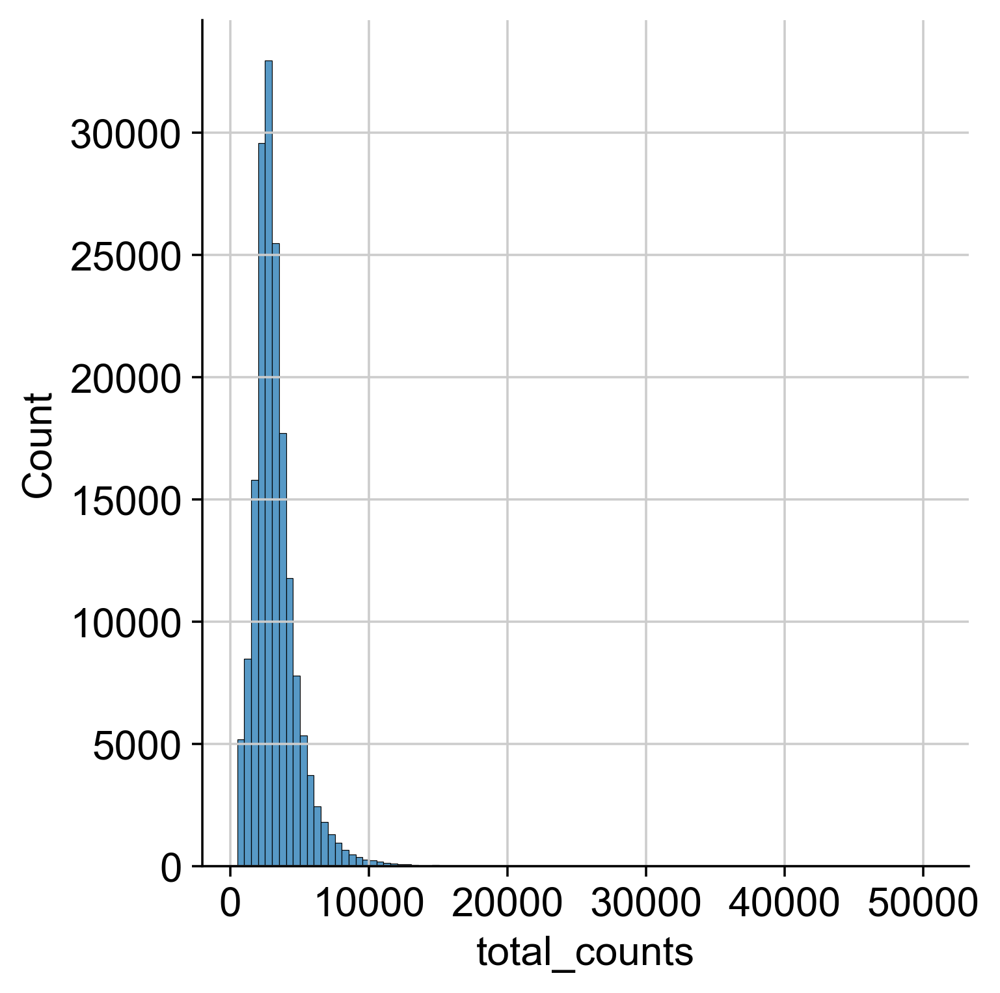

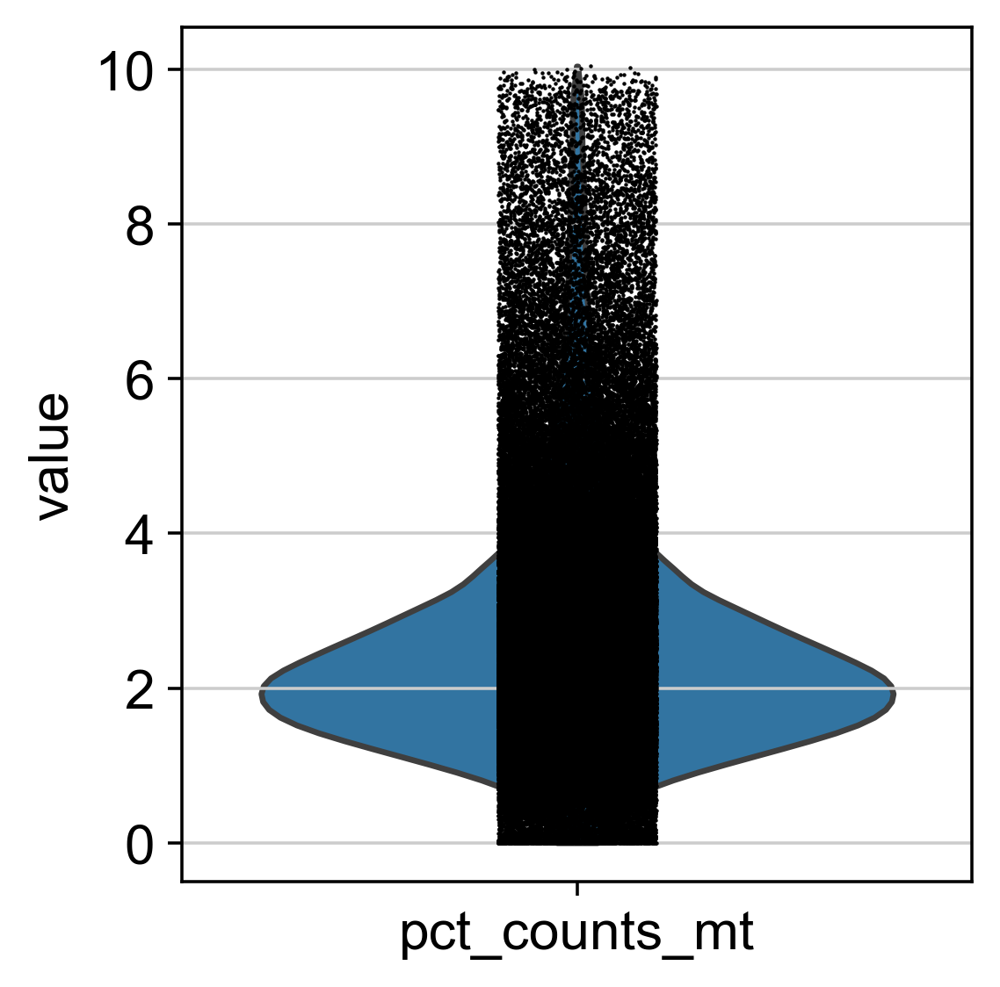

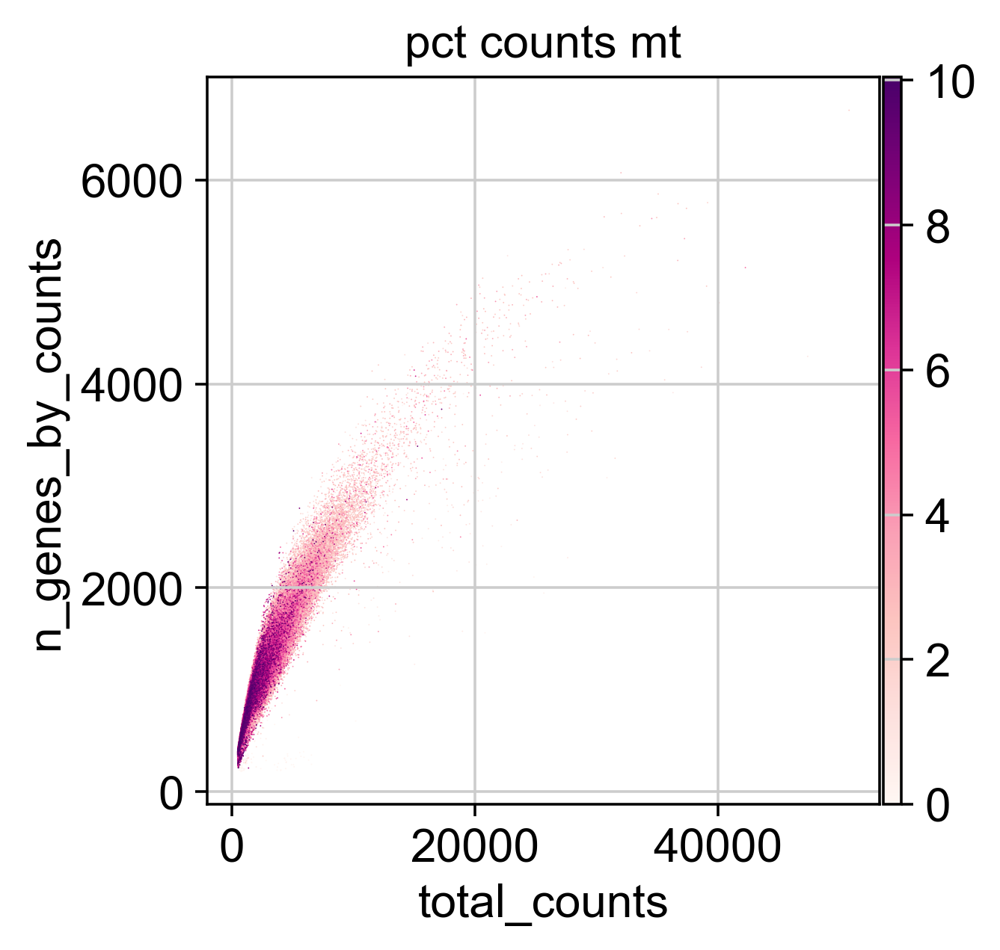

In [44]:
p1 = sns.displot(sample_object.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(sample_object, "pct_counts_mt")
p3 = sc.pl.scatter(sample_object, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

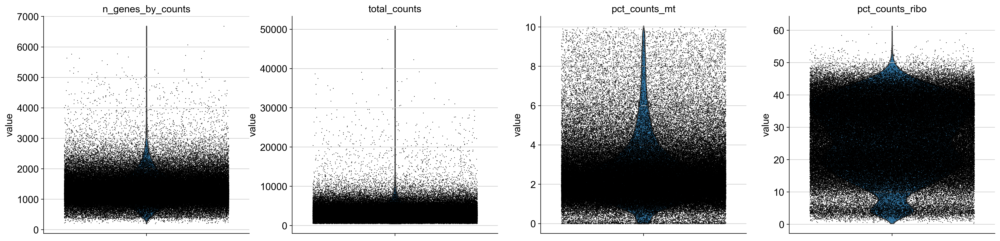

In [45]:
sc.pl.violin(sample_object, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

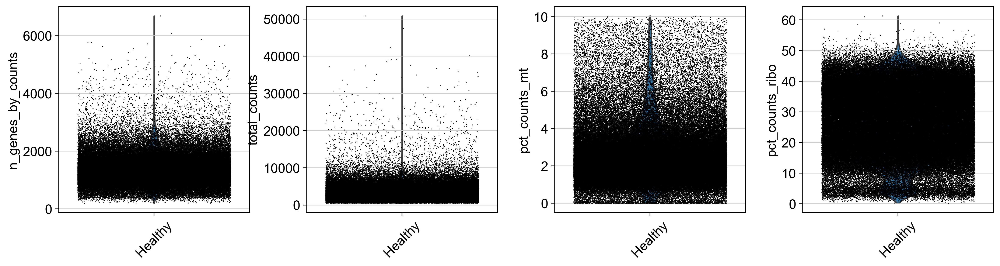

In [46]:
sc.pl.violin(sample_object, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, groupby = 'COVID_status', rotation = 45)

In [49]:
sample_object

AnnData object with n_obs × n_vars = 173684 × 22886
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'patient_id', 'sample_id', 'sequencing_library', 'Protein_modality_weight', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'name', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'COVID_status_colors'

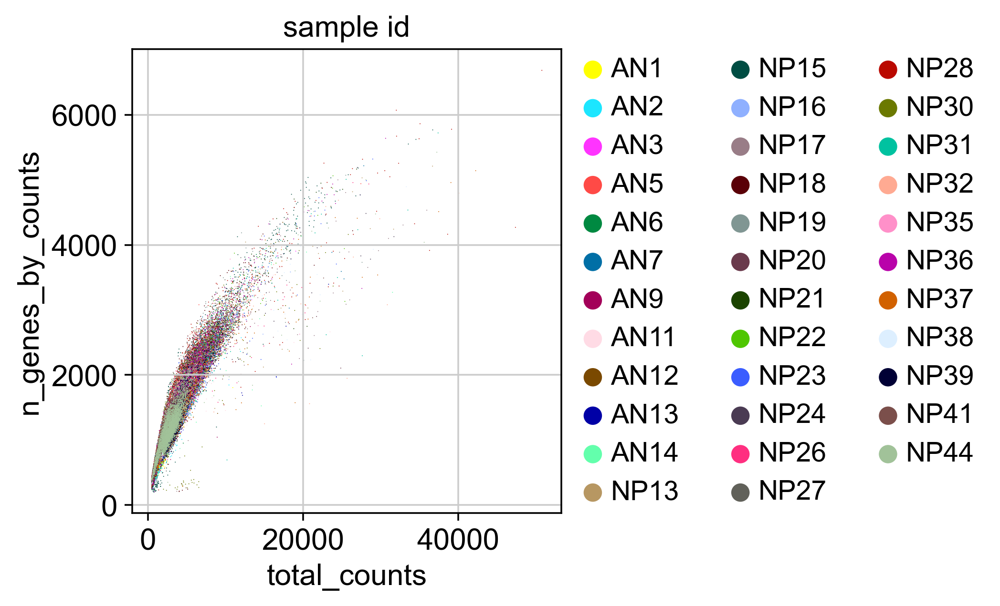

In [50]:
sc.pl.scatter(sample_object, x='total_counts', y='n_genes_by_counts', color = "sample_id")

### QC-based filtering

In [51]:
sample_object.obs.head()

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,Age_group,BMI,COVID_severity,COVID_status,Ethnicity,...,Protein_modality_weight,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb
index,,,,,,,,,,,,,,,,,,,,,
CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1,CV001_KM10202384-CV001_KM10202394,5493.0,1767,5297.0,184,Adult,Unknown,Healthy,Healthy,EUR,...,0.359517,1767,1767,5493.0,36.0,0.655380,1287.0,23.429819,2.0,0.03641
CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1,CV001_KM10202384-CV001_KM10202394,4868.0,1577,2169.0,165,Adult,Unknown,Healthy,Healthy,EUR,...,0.577522,1577,1577,4868.0,42.0,0.862777,2023.0,41.557106,0.0,0.00000
CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1,CV001_KM10202384-CV001_KM10202394,3178.0,1257,1330.0,163,Adult,Unknown,Healthy,Healthy,EUR,...,0.369143,1257,1257,3178.0,2.0,0.062933,1148.0,36.123348,0.0,0.00000
CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1,CV001_KM10202384-CV001_KM10202394,4745.0,1477,1255.0,161,Adult,Unknown,Healthy,Healthy,EUR,...,0.785563,1477,1477,4745.0,7.0,0.147524,2089.0,44.025291,0.0,0.00000
CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1,CV001_KM10202384-CV001_KM10202394,1902.0,954,1711.0,166,Adult,Unknown,Healthy,Healthy,EUR,...,0.564174,954,954,1902.0,8.0,0.420610,637.0,33.491062,0.0,0.00000


In [52]:
sample_object.shape

(173684, 22886)

In [12]:
sample_object.obs["mt_ok"] = sample_object.obs['pct_counts_mt'] <= 20
sample_object.obs.head()


,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,Age_group,BMI,COVID_severity,COVID_status,Ethnicity,...,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,mt_ok
index,,,,,,,,,,,,,,,,,,,,,
CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1,CV001_KM10202384-CV001_KM10202394,5493.0,1767,5297.0,184,Adult,Unknown,Healthy,Healthy,EUR,...,1767,1767,5493.0,36.0,0.655380,1287.0,23.429819,2.0,0.03641,True
CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1,CV001_KM10202384-CV001_KM10202394,4868.0,1577,2169.0,165,Adult,Unknown,Healthy,Healthy,EUR,...,1577,1577,4868.0,42.0,0.862777,2023.0,41.557106,0.0,0.00000,True
CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1,CV001_KM10202384-CV001_KM10202394,3178.0,1257,1330.0,163,Adult,Unknown,Healthy,Healthy,EUR,...,1257,1257,3178.0,2.0,0.062933,1148.0,36.123348,0.0,0.00000,True
CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1,CV001_KM10202384-CV001_KM10202394,4745.0,1477,1255.0,161,Adult,Unknown,Healthy,Healthy,EUR,...,1477,1477,4745.0,7.0,0.147524,2089.0,44.025291,0.0,0.00000,True
CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1,CV001_KM10202384-CV001_KM10202394,1902.0,954,1711.0,166,Adult,Unknown,Healthy,Healthy,EUR,...,954,954,1902.0,8.0,0.420610,637.0,33.491062,0.0,0.00000,True


In [54]:
sample_object.obs.mt_ok.value_counts()

mt_ok
True    173684
Name: count, dtype: int64

In [13]:
print(f"Total number of cells: {sample_object.n_obs}")
sample_object = sample_object[(sample_object.obs.mt_ok)].copy()

print(f"Number of cells after filtering of low quality cells: {sample_object.n_obs}")

Total number of cells: 173684
Number of cells after filtering of low quality cells: 173684


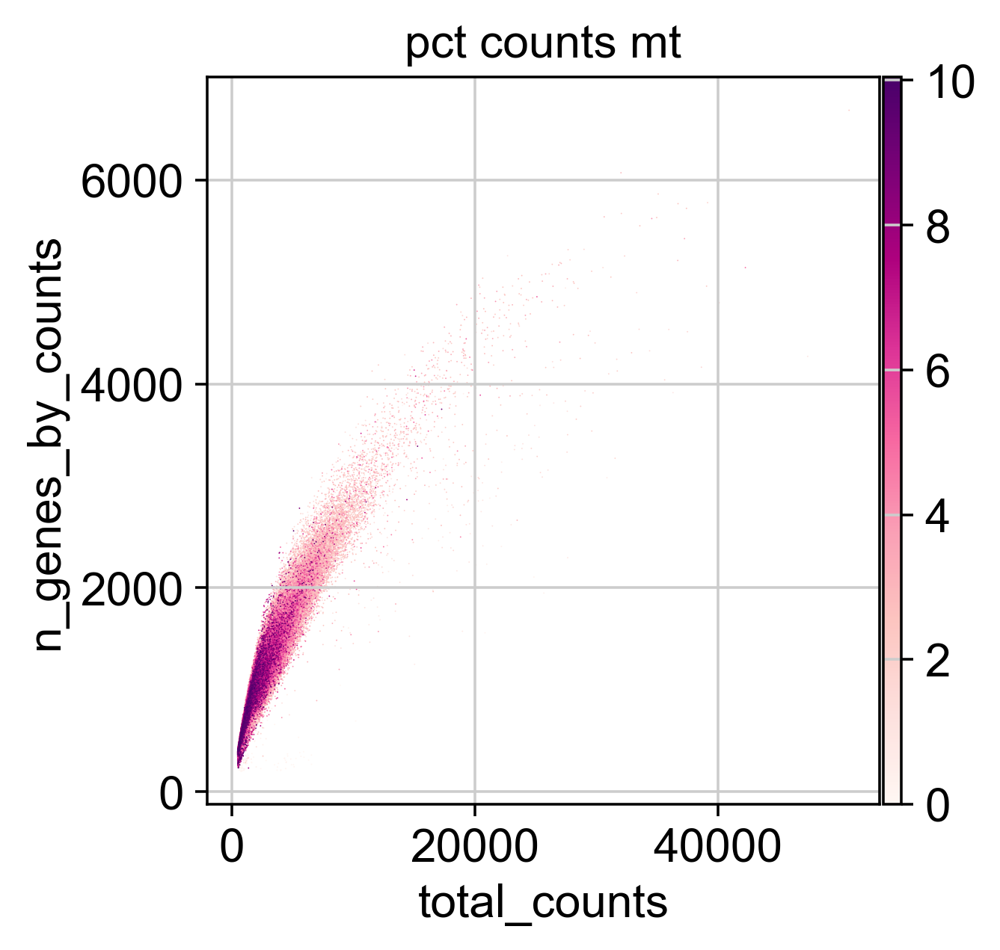

In [56]:
p1 = sc.pl.scatter(sample_object, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

### Add sample sex covariate

In [14]:
annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")

In [58]:
annot.head()

,ensembl_gene_id,start_position,end_position,chromosome_name
external_gene_name,,,,
MT-TF,ENSG00000210049,577,647,MT
MT-RNR1,ENSG00000211459,648,1601,MT
MT-TV,ENSG00000210077,1602,1670,MT
MT-RNR2,ENSG00000210082,1671,3229,MT
MT-TL1,ENSG00000209082,3230,3304,MT


- Y chrom

In [15]:
chrY_genes = sample_object.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrY_genes

Index(['RPS4Y1', 'ZFY', 'ZFY-AS1', 'LINC00278', 'TBL1Y', 'USP9Y', 'DDX3Y',
       'UTY', 'TMSB4Y', 'NLGN4Y', 'FAM224B', 'TTTY14', 'KDM5D', 'TTTY10',
       'EIF1AY', 'RPS4Y2'],
      dtype='object')

In [16]:
sample_object.obs['percent_chrY'] = np.sum(
    sample_object[:, chrY_genes].X, axis = 1).A1 / np.sum(sample_object.X, axis = 1).A1 * 100

- X chrom

In [17]:
chrX_genes = sample_object.var_names.intersection(annot.index[annot.chromosome_name == "X"])
chrX_genes

Index(['PLCXD1', 'GTPBP6', 'LINC00685', 'PPP2R3B', 'CRLF2', 'CSF2RA', 'IL3RA',
       'SLC25A6', 'LINC00106', 'ASMTL-AS1',
       ...
       'RAB39B', 'CLIC2', 'F8A2', 'F8A3', 'TMLHE-AS1', 'TMLHE', 'SPRY3',
       'VAMP7', 'IL9R', 'WASIR1'],
      dtype='object', length=622)

In [18]:
sample_object.obs['percent_chrX'] = np.sum(
    sample_object[:, chrX_genes].X, axis = 1).A1 / np.sum(sample_object.X, axis = 1).A1 * 100

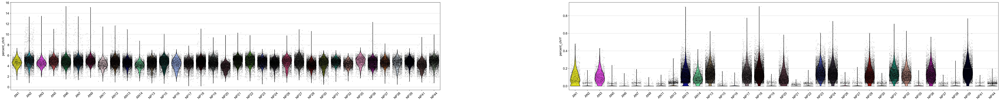

In [19]:
sc.set_figure_params(figsize=(25, 7),dpi=100)
sc.pl.violin(sample_object, ["percent_chrX", "percent_chrY"], jitter = 0.4, groupby = 'sample_id', rotation = 45)

### Cell cycle scores

In [73]:
!if [ ! -f /Users/mairi.mcclean/data/qc_files/cell_cycle_gene.txt ]; then curl -o /Users/mairi.mcclean/data/qc_files/cell_cycle_gene.txt https://raw.githubusercontent.

zsh:1: parse error near `https://raw.githubus...'


In [74]:
cell_cycle_genes = [x.strip() for x in open('/Users/mairi.mcclean/data/qc_files/cell_cycle_gene.txt')]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in sample_object.var_names]
print(len(cell_cycle_genes))

97
94


In [75]:
# create other anndata object for score calculation

adata_log = anndata.AnnData(X = sample_object.X,  var = sample_object.var, obs = sample_object.obs)
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['S100A9', 'S100A12', 'S100A8', 'GNLY', 'IGKC', 'IGKV4-1', 'IGKV5-2', 'IGKV1-5', 'IGKV1-6', 'IGKV1-8', 'IGKV1-9', 'IGKV3-11', 'IGKV1-12', 'IGKV3-15', 'IGKV1-16', 'IGKV1-17', 'IGKV3-20', 'IGKV2-24', 'IGKV1-27', 'IGKV2-29', 'IGKV2-30', 'IGKV1-33', 'IGKV1-39', 'IGKV2D-40', 'IGKV1D-39', 'IGKV1D-33', 'IGKV2D-30', 'IGKV2D-29', 'IGKV3D-20', 'IGKV1D-16', 'IGKV1D-13', 'JCHAIN', 'PPBP', 'CD74', 'HSPA1A', 'ACTB', 'TMSB4X', 'SLC25A37', 'PTGDS', 'HBB', 'HBG2', 'FTH1', 'NEAT1', 'MALAT1', 'LYZ', 'FOS', 'IGHA2', 'IGHG4', 'IGHG2', 'IGHA1', 'IGHG1', 'IGHM', 'IGHV6-1', 'IGHV1-2', 'IGHV4-4', 'IGHV2-5', 'IGHV3-7', 'IGHV5-10-1', 'IGHV3-11', 'IGHV3-13', 'IGHV3-15', 'IGHV1-18', 'IGHV3-20', 'IGHV3-21', 'IGHV3-23', 'IGHV2-26', 'IGHV3-30', 'IGHV3-33', 'IGHV4-34', 'IGHV4-39', 'IGHV3-43', 'IGHV1-46', 'IGHV3-48', 'IGHV3-49', 'IGHV5-51', 'IGHV3-53', 'IGHV1-58', 'IGHV4-59', 'IGHV4-61', 'IGHV3-6

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    685 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    558 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


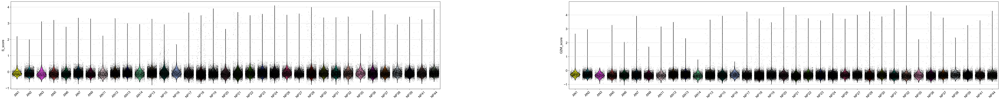

In [77]:
sc.tl.score_genes_cell_cycle(adata_log, s_genes = s_genes, g2m_genes = g2m_genes)
sc.pl.violin(adata_log, ['S_score', 'G2M_score'],
             jitter = 0.4, groupby = 'sample_id', rotation = 45)

In [78]:
sample_object.obs['S_score'] = adata_log.obs['S_score']
sample_object.obs['G2M_score'] = adata_log.obs['G2M_score']
sample_object

AnnData object with n_obs × n_vars = 173684 × 22886
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'patient_id', 'sample_id', 'sequencing_library', 'Protein_modality_weight', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'mt_ok', 'percent_chrY', 'percent_chrX', 'S_score', 'G2M_score'
    var: 'name', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'COVID_status_colors', 'sample_id_colors'

### Predict doublets

In [79]:
import scrublet

In [80]:
scrub = scrublet.Scrublet(sample_object.X)

Preprocessing...


/Users/mairi.mcclean/mambaforge/envs/new_scanpy_local/lib/python3.9/site-packages/scrublet/helper_functions.py:241: RuntimeWarning: invalid value encountered in log
  gLog = lambda input: np.log(input[1] * np.exp(-input[0]) + input[2])
/Users/mairi.mcclean/mambaforge/envs/new_scanpy_local/lib/python3.9/site-packages/scrublet/helper_functions.py:254: RuntimeWarning: invalid value encountered in sqrt
  CV_input = np.sqrt(b);


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.47
Detected doublet rate = 1.1%
Estimated detectable doublet fraction = 59.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.8%
Elapsed time: 405.5 seconds


(<Figure size 800x300 with 2 Axes>,
 array([<Axes: title={'center': 'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <Axes: title={'center': 'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

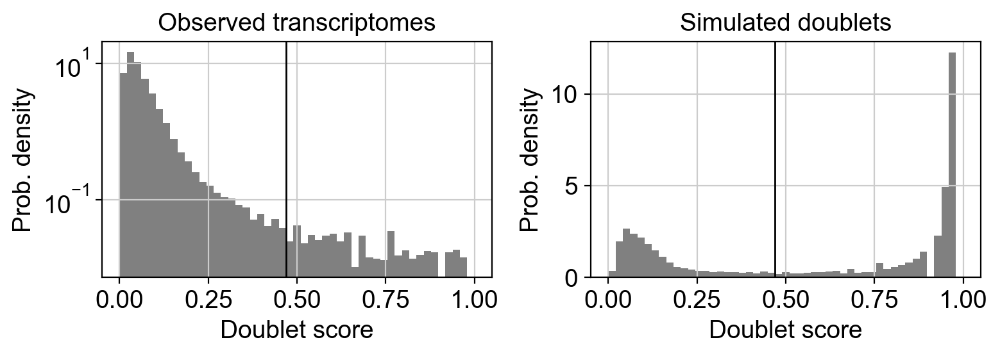

In [81]:
sample_object.obs['doublet_scores'], sample_object.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

In [82]:
sum(sample_object.obs['predicted_doublets'])

1881

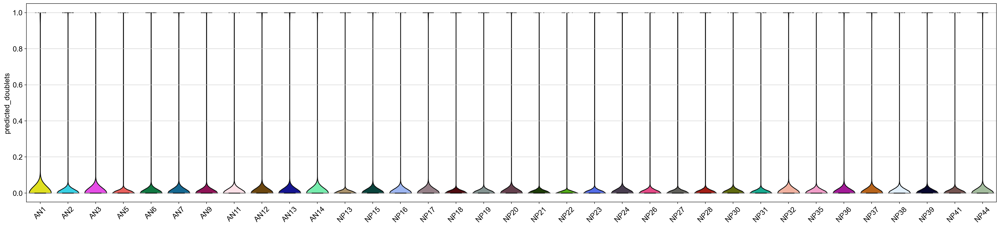

In [85]:
#check if our predicted doublets also have more detected genes in general
sc.pl.violin(sample_object, ['predicted_doublets'],
             jitter = 0.2, groupby = 'sample_id', rotation = 45)

### Prepare counts for individual slots

In [86]:
sample_object.raw = sample_object.copy()
sample_object.layers['counts'] = sample_object.X.copy()
sample_object.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(sample_object, inplace = False)["X"]
)
sample_object

normalizing counts per cell
    finished (0:00:03)


AnnData object with n_obs × n_vars = 173684 × 22886
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'patient_id', 'sample_id', 'sequencing_library', 'Protein_modality_weight', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'mt_ok', 'percent_chrY', 'percent_chrX', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets'
    var: 'name', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'COVID_status_colors', 'sample_id_colors'
    layers: 'counts', 'sqrt_norm'

### Export object

In [87]:
sample_object.write('/Volumes/Expansion/data_lake/processed_files/qc_objects/human/yoshida_2021/Yoshida2021_scrna_PBMC_mm_230306_qcd.h5ad')